<a href="https://colab.research.google.com/github/rahul-t-p/wheatRust-Detection/blob/master/wheat_rust_model1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Description:
# Model -1
- efficientnet-b0
- Data Augmentation(224x224)
- Upsampling
- Stratified CV

# Kaggle initial setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
cd drive/My Drive/Colab Notebooks

/content/drive/My Drive/Colab Notebooks


In [0]:
#  from google.colab import files
#  files.upload()

In [0]:
 !pip install -q kaggle

In [0]:
 !mkdir -p ~/.kaggle
 !cp kaggle.json ~/.kaggle/

In [0]:
!chmod 600 ~/.kaggle/kaggle.json

In [7]:
cd /content/

/content


In [8]:
!kaggle datasets download -d hakymulla/cgiar-computer-vision-for-crop-disease

100% 2.99G/3.00G [00:53<00:00, 17.4MB/s]
100% 3.00G/3.00G [00:53<00:00, 59.9MB/s]


In [0]:
%%capture
!unzip cgiar-computer-vision-for-crop-disease.zip
!rm cgiar-computer-vision-for-crop-disease.zip

# Workspace setup

In [0]:
%%capture
!pip install -U catalyst
!pip install albumentations
!pip install -U efficientnet-pytorch

Restart runtime

In [0]:
# plotly configuration
import IPython

def configure_plotly_browser_state():
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))


IPython.get_ipython().events.register('pre_run_cell', configure_plotly_browser_state)

In [2]:
%load_ext tensorboard

In [3]:
# a gif image is causing some problem while training so let's get rid of that
!rm ICLR/train/train/leaf_rust/*.gif

In [4]:
!nvidia-smi

Sun Mar  1 04:26:25 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.48.02    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P8     6W /  75W |      0MiB /  7611MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

# Importing Packages

In [5]:
from typing import Callable, List, Tuple 

import os
import torch
import catalyst

from catalyst.dl import utils

print(f"torch: {torch.__version__}, catalyst: {catalyst.__version__}")

os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # "" - CPU, "0" - 1 GPU, "0,1" - MultiGPU

SEED = 42
utils.set_global_seed(SEED)
utils.prepare_cudnn(deterministic=True)

alchemy not available, to install alchemy, run `pip install alchemy-catalyst`.


torch: 1.4.0, catalyst: 20.02.4


# Dataset Preprocessing

In [6]:
from pathlib import Path

ROOT = "ICLR/"

In [7]:
from catalyst.utils import (
    create_dataset, create_dataframe, get_dataset_labeling, map_dataframe
)
dataset = create_dataset(dirs=f"{ROOT}train/train/*", extension="*")
df = create_dataframe(dataset, columns=["class", "filepath"])

tag_to_label = get_dataset_labeling(df, "class")
class_names = [
    name for name, id_ in sorted(tag_to_label.items(), key=lambda x: x[1])
]

df_with_labels = map_dataframe(
    df, 
    tag_column="class", 
    class_column="label", 
    tag2class=tag_to_label, 
    verbose=False
)
df_with_labels.head()

,class,filepath,label
0,healthy_wheat,ICLR/train/train/healthy_wheat/03TD19.jfif,0
1,healthy_wheat,ICLR/train/train/healthy_wheat/0LBIWV.jpg,0
2,healthy_wheat,ICLR/train/train/healthy_wheat/0O5BON.jfif,0
3,healthy_wheat,ICLR/train/train/healthy_wheat/0PFX47.jpg,0
4,healthy_wheat,ICLR/train/train/healthy_wheat/1LNMUQ.jfif,0


In [8]:
df_with_labels.shape

(875, 3)

In [9]:
df_with_labels = catalyst.utils.pandas.balance_classes(df_with_labels, class_column='label',
                                                    random_state=SEED, how='upsampling')
print(df_with_labels.shape)
df_with_labels.head()

(1128, 3)


,class,filepath,label
0,healthy_wheat,ICLR/train/train/healthy_wheat/03TD19.jfif,0
1,healthy_wheat,ICLR/train/train/healthy_wheat/0LBIWV.jpg,0
2,healthy_wheat,ICLR/train/train/healthy_wheat/0O5BON.jfif,0
3,healthy_wheat,ICLR/train/train/healthy_wheat/0PFX47.jpg,0
4,healthy_wheat,ICLR/train/train/healthy_wheat/1LNMUQ.jfif,0


In [10]:
df_with_labels.loc[:,'kfold'] = -1
df_with_labels.head()

,class,filepath,label,kfold
0,healthy_wheat,ICLR/train/train/healthy_wheat/03TD19.jfif,0,-1
1,healthy_wheat,ICLR/train/train/healthy_wheat/0LBIWV.jpg,0,-1
2,healthy_wheat,ICLR/train/train/healthy_wheat/0O5BON.jfif,0,-1
3,healthy_wheat,ICLR/train/train/healthy_wheat/0PFX47.jpg,0,-1
4,healthy_wheat,ICLR/train/train/healthy_wheat/1LNMUQ.jfif,0,-1


In [11]:
df_with_labels = df_with_labels.sample(frac=1).reset_index(drop=True)
df_with_labels.head()

,class,filepath,label,kfold
0,stem_rust,ICLR/train/train/stem_rust/1CQ95E.JPG,2,-1
1,stem_rust,ICLR/train/train/stem_rust/7QBIPY.jpg,2,-1
2,leaf_rust,ICLR/train/train/leaf_rust/1Z2P44.jpg,1,-1
3,healthy_wheat,ICLR/train/train/healthy_wheat/ZB9CAK.jpg,0,-1
4,stem_rust,ICLR/train/train/stem_rust/4PS17R.jpg,2,-1


In [12]:
from sklearn.model_selection import StratifiedKFold
import numpy as np

X = df_with_labels.filepath.values
y = df_with_labels.label.values

skf = StratifiedKFold(n_splits=5)

for fold, (train_index, val_index) in enumerate(skf.split(X, y)):
    #print("TRAIN:", train_index, "TEST:", val_index)
    df_with_labels.loc[val_index, 'kfold'] = fold

In [13]:
df_with_labels.kfold.value_counts()

2    226
1    226
0    226
4    225
3    225
Name: kfold, dtype: int64

In [15]:
df_with_labels.head()

,class,filepath,label,kfold
0,stem_rust,ICLR/train/train/stem_rust/1CQ95E.JPG,2,0
1,stem_rust,ICLR/train/train/stem_rust/7QBIPY.jpg,2,0
2,leaf_rust,ICLR/train/train/leaf_rust/1Z2P44.jpg,1,0
3,healthy_wheat,ICLR/train/train/healthy_wheat/ZB9CAK.jpg,0,0
4,stem_rust,ICLR/train/train/stem_rust/4PS17R.jpg,2,0


In [16]:
df_with_labels.shape

(1128, 4)

In [58]:
train_folds = [0,1,2,3]
valid_fold = [4]

train_data = df_with_labels[df_with_labels.kfold.isin(train_folds)].reset_index(drop=True)
train_data.drop(columns=['kfold'], inplace=True)
valid_data = df_with_labels[df_with_labels.kfold.isin(valid_fold)].reset_index(drop=True)
valid_data.drop(columns=['kfold'], inplace=True)

train_data.head()

,class,filepath,label
0,stem_rust,ICLR/train/train/stem_rust/1CQ95E.JPG,2
1,stem_rust,ICLR/train/train/stem_rust/7QBIPY.jpg,2
2,leaf_rust,ICLR/train/train/leaf_rust/1Z2P44.jpg,1
3,healthy_wheat,ICLR/train/train/healthy_wheat/ZB9CAK.jpg,0
4,stem_rust,ICLR/train/train/stem_rust/4PS17R.jpg,2


In [59]:
valid_data.head()

,class,filepath,label
0,healthy_wheat,ICLR/train/train/healthy_wheat/R2EUB2.jfif,0
1,healthy_wheat,ICLR/train/train/healthy_wheat/HNUJLZ.jfif,0
2,healthy_wheat,ICLR/train/train/healthy_wheat/5FSDEI.jpg,0
3,healthy_wheat,ICLR/train/train/healthy_wheat/H75C3Z.jpg,0
4,healthy_wheat,ICLR/train/train/healthy_wheat/NQ15I3.jfif,0


### """

Text(0.5, 1.0, 'Test Data')

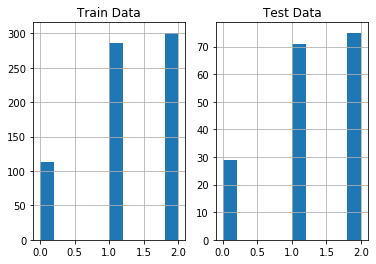

In [16]:
from catalyst.utils import split_dataframe_train_test
import matplotlib.pyplot as plt

train_data, valid_data = split_dataframe_train_test(
    df_with_labels, test_size=0.2, random_state=SEED, stratify=df_with_labels.label.to_numpy())

plt.subplot(1,2,1)
train_data.label.hist()
plt.title('Train Data')
plt.subplot(1,2,2)
valid_data.label.hist()
plt.title('Test Data')

Text(0.5, 1.0, 'Test Data')

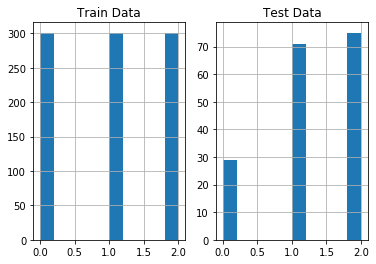

In [11]:
train_data = catalyst.utils.pandas.balance_classes(train_data, class_column='label',
                                                    random_state=SEED, how='upsampling')

plt.subplot(1,2,1)
train_data.label.hist()
plt.title('Train Data')
plt.subplot(1,2,2)
valid_data.label.hist()
plt.title('Test Data')

### """

In [60]:
train_data, valid_data = (
    train_data.to_dict('records'), valid_data.to_dict('records')
)

In [62]:
from catalyst.dl import utils
from catalyst.data import ImageReader, ScalarReader, ReaderCompose


num_classes = len(tag_to_label)

# ReaderCompose collects different Readers into one pipeline
open_fn = ReaderCompose([
    
    # Reads images from the `rootpath` folder 
    # using the key `input_key =" filepath "` (here should be the filename)
    # and writes it to the output dictionary by `output_key="features"` key
    ImageReader(
        input_key="filepath",
        output_key="features",
        rootpath=None
    ),
    
    # Reads a number from our dataframe 
    # by the key `input_key =" label "` to np.long
    # and writes it to the output dictionary by `output_key="targets"` key
    ScalarReader(
        input_key="label",
        output_key="targets",
        default_value=-1,
        dtype=np.int64
    ),
    
    # Same as above, but with one encoding
    ScalarReader(
        input_key="label",
        output_key="targets_one_hot",
        default_value=-1,
        dtype=np.int64, 
        one_hot_classes=num_classes
    )
])

# Augmentations

In [27]:
import albumentations as albu
from albumentations.pytorch import ToTensor

BORDER_CONSTANT = 0
BORDER_REFLECT = 2

def pre_transforms(image_size=224):
    # Convert the image to a square of size image_size x image_size
    # (keeping aspect ratio)
    result = [
        albu.LongestMaxSize(max_size=image_size),
        albu.PadIfNeeded(image_size, image_size, border_mode=BORDER_CONSTANT)
    ]
    
    return result

def hard_transforms():
    result = [
        # Random shifts, stretches and turns with a 50% probability
        albu.ShiftScaleRotate( 
            shift_limit=0.1,
            scale_limit=0.1,
            rotate_limit=15,
            border_mode=BORDER_REFLECT,
            p=0.5
        ),
        albu.VerticalFlip(),
        albu.IAAPerspective(scale=(0.02, 0.05), p=0.3),
        # Random brightness / contrast with a 30% probability
        albu.RandomBrightnessContrast(
            brightness_limit=0.2, contrast_limit=0.2, p=0.3
        ),
        # Random gamma changes with a 30% probability
        albu.RandomGamma(gamma_limit=(85, 115), p=0.3),
        # Randomly changes the hue, saturation, and color value of the input image
        albu.HueSaturationValue(p=0.3),
        albu.JpegCompression(quality_lower=80),
    ]
    
    return result

def post_transforms():
    # we use ImageNet image normalization
    # and convert it to torch.Tensor
    return [albu.Normalize(), ToTensor()]

def compose(transforms_to_compose):
    # combine all augmentations into one single pipeline
    result = albu.Compose([
      item for sublist in transforms_to_compose for item in sublist
    ])
    return result

In [28]:
from catalyst.data import Augmentor


train_transforms = compose([
    pre_transforms(), 
    hard_transforms(), 
    post_transforms()
])
valid_transforms = compose([pre_transforms(), post_transforms()])

show_transforms = compose([pre_transforms(), hard_transforms()])

# Takes an image from the input dictionary by the key `dict_key` 
# and performs `train_transforms` on it.
train_data_transforms = Augmentor(
    dict_key="features",
    augment_fn=lambda x: train_transforms(image=x)["image"]
)


# Similarly for the validation part of the dataset. 
# we only perform squaring, normalization and ToTensor
valid_data_transforms = Augmentor(
    dict_key="features",
    augment_fn=lambda x: valid_transforms(image=x)["image"]
)

In [29]:
from catalyst.utils import imread
import numpy as np

import matplotlib.pyplot as plt

def show_examples(images: List[Tuple[str, np.ndarray]]):
    _indexes = [(i, j) for i in range(2) for j in range(2)]
    
    f, ax = plt.subplots(2, 2, figsize=(9, 9))
    for (i, j), (title, img) in zip(_indexes, images):
        ax[i, j].imshow(img)
        ax[i, j].set_title(title)
    f.tight_layout()

def read_random_images(paths: List[Path]) -> List[Tuple[str, np.ndarray]]:
    data = np.random.choice(paths, size=4)
    result = []
    for d in data:
        title = f"{d.parent.name}: {d.name}"
        _image = imread(d)
        result.append((title, _image))
    
    return result

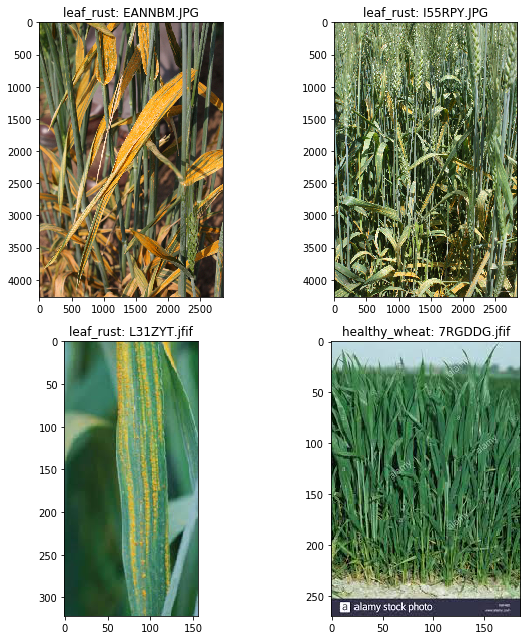

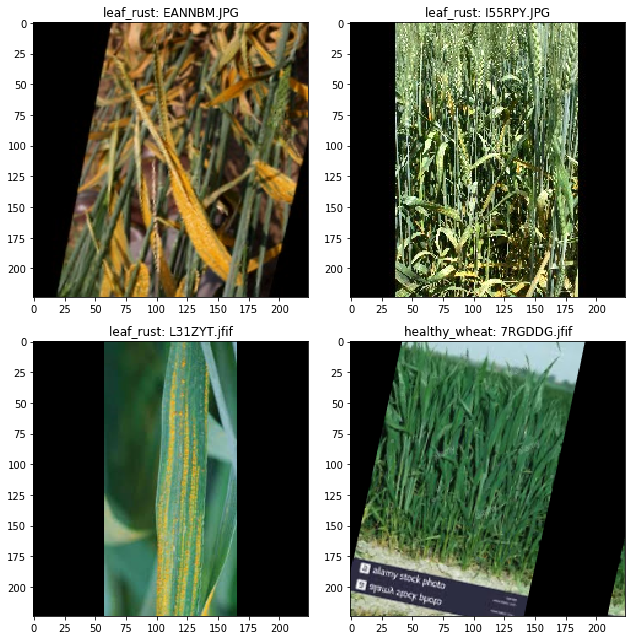

In [30]:
ALL_IMAGES = list(Path(ROOT).glob("train/train/*/*"))
ALL_IMAGES = list(filter(lambda x: not x.name.startswith("."), ALL_IMAGES))

images = read_random_images(ALL_IMAGES)
show_examples(images)
images = [
    (title, show_transforms(image=i)["image"])
    for (title, i) in images
]
show_examples(images)

# Data Loaders

In [63]:
import collections

is_fp16_used = False

def get_loaders(
    open_fn: Callable,
    train_transforms_fn,
    valid_transforms_fn,
    batch_size: int = 64, 
    num_workers: int = 4,
    sampler = None
) -> collections.OrderedDict:
    """
    Args:
        open_fn: Reader for reading data from a dataframe
        train_transforms_fn: Augmentor for train part
        valid_transforms_fn: Augmentor for valid part
        batch_size: batch size
        num_workers: How many subprocesses to use to load data,
        sampler: An object of the torch.utils.data.Sampler class 
            for the dataset data sampling strategy specification
    """
    train_loader = utils.get_loader(
        train_data,
        open_fn=open_fn,
        dict_transform=train_transforms_fn,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=sampler is None, # shuffle data only if Sampler is not specified (PyTorch requirement)
        sampler=sampler,
        drop_last=True,
    )

    valid_loader = utils.get_loader(
        valid_data,
        open_fn=open_fn,
        dict_transform=valid_transforms_fn,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=False, 
        sampler=None,
        drop_last=True,
    )

    # Catalyst expects an ordered dictionary with train/valid/infer loaders. 
    # The number of loaders can vary.
    # For example, it can easily handle even some complex logic like:
    # loaders["train_dataset1"] = train_loader_1
    # loaders["train_dataset2"] = train_loader_2
    # ....
    # loaders["valid_1"] = valid_loader_1
    # loaders["valid_2"] = valid_loader_2
    # ...
    # loaders["infer_1"] = infer_loader_1
    # loaders["infer_2"] = infer_loader_2
    # ...
    
    loaders = collections.OrderedDict()
    loaders["train"] = train_loader
    loaders["valid"] = valid_loader

    return loaders

if is_fp16_used:
    batch_size = 128
else:
    batch_size = 64

print(f"batch_size: {batch_size}")

loaders = get_loaders(
    open_fn=open_fn, 
    train_transforms_fn=train_data_transforms,
    valid_transforms_fn=valid_data_transforms,
    batch_size=batch_size,
)


batch_size: 64


# Model

In [32]:
from efficientnet_pytorch import EfficientNet

In [33]:
def get_model(n_classes):
    model = EfficientNet.from_pretrained('efficientnet-b0') 
    in_features = model._fc.in_features
    model._fc = torch.nn.Linear(in_features, n_classes)
    return model

model = get_model(3)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/checkpoints/efficientnet-b0-355c32eb.pth



Loaded pretrained weights for efficientnet-b0


In [34]:
model

EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d(padding=(0, 1, 0, 1), value=0.0)
  )
  (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
        (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
      )
      (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        32, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        8, 32, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
        32, 16, kernel_size=

In [47]:
# for param in model._fc.parameters():
#     # param.requires_grad = True
#     print(param)
#     print(param.requires_grad)

# Training

In [64]:
import torch
import torch.nn as nn
from catalyst.contrib.nn import FocalLossMultiClass, OneCycleLRWithWarmup

num_epochs = 11

# as we are working on basic classification problem (no multi-class/multi-label)
# let's use standard CE loss
criterion = FocalLossMultiClass()
optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)
scheduler = OneCycleLRWithWarmup(
    optimizer, 
    num_steps=num_epochs, 
    lr_range=(0.001, 3e-4),
    warmup_steps=1
)

In [65]:
from catalyst.dl import SupervisedRunner

logdir = "./logs/classification"

device = utils.get_device()
print(f"device: {device}")

if is_fp16_used:
    fp16_params = dict(opt_level="O1") # params for FP16
else:
    fp16_params = None

print(f"FP16 params: {fp16_params}")

runner = SupervisedRunner(device=device,input_target_key="targets_one_hot")

device: cuda
FP16 params: None


In [66]:
# as we are working on classification task
from catalyst.dl.callbacks import AccuracyCallback, AUCCallback, F1ScoreCallback

runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    # We can specify the callbacks list for the experiment;
    # For this task, we will check accuracy, AUC and F1 metrics
    callbacks=[
        AccuracyCallback(num_classes=num_classes),
        AUCCallback(
            num_classes=num_classes,
            input_key="targets_one_hot",
            class_names=class_names
        ),
        F1ScoreCallback(
            input_key="targets_one_hot",
            activation="Softmax"
        )
    ],
    # path to save logs
    logdir=logdir,
    
    num_epochs=num_epochs,
    
    # save our best checkpoint by AUC metric
    main_metric="auc/_mean",
    # AUC needs to be maximized.
    minimize_metric=False,
    
    # for FP16. It uses the variable from the very first cell
    fp16=fp16_params,
    
    # for external monitoring tools, like Alchemy
    monitoring_params=None,
    
    # prints train logs
    verbose=True
)


1/11 * Epoch (train):   0% 0/14 [00:00<?, ?it/s]
1/11 * Epoch (train):   0% 0/14 [00:22<?, ?it/s, accuracy01=79.688, f1_score=0.622, loss=0.101]
1/11 * Epoch (train):   7% 1/14 [00:22<04:51, 22.44s/it, accuracy01=79.688, f1_score=0.622, loss=0.101]

/usr/local/lib/python3.6/dist-packages/catalyst/utils/criterion/f1_score.py:31: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.




1/11 * Epoch (train):   7% 1/14 [00:29<04:51, 22.44s/it, accuracy01=84.375, f1_score=0.650, loss=0.082]
1/11 * Epoch (train):  14% 2/14 [00:29<03:32, 17.69s/it, accuracy01=84.375, f1_score=0.650, loss=0.082]
1/11 * Epoch (train):  14% 2/14 [00:29<03:32, 17.69s/it, accuracy01=81.250, f1_score=0.642, loss=0.087]
1/11 * Epoch (train):  21% 3/14 [00:29<02:18, 12.61s/it, accuracy01=81.250, f1_score=0.642, loss=0.087]
1/11 * Epoch (train):  21% 3/14 [00:30<02:18, 12.61s/it, accuracy01=79.688, f1_score=0.631, loss=0.106]
1/11 * Epoch (train):  29% 4/14 [00:30<01:30,  9.07s/it, accuracy01=79.688, f1_score=0.631, loss=0.106]
1/11 * Epoch (train):  29% 4/14 [00:50<01:30,  9.07s/it, accuracy01=76.562, f1_score=0.649, loss=0.100]
1/11 * Epoch (train):  36% 5/14 [00:50<01:50, 12.30s/it, accuracy01=76.562, f1_score=0.649, loss=0.100]
1/11 * Epoch (train):  36% 5/14 [00:51<01:50, 12.30s/it, accuracy01=81.250, f1_score=0.628, loss=0.109]
1/11 * Epoch (train):  43% 6/14 [00:51<01:10,  8.84s/it, accura

In [67]:
utils.plot_metrics(
    logdir=logdir, 
    # specify which metrics we want to plot
    metrics=["loss", "accuracy01", "auc/_mean", "f1_score", "_base/lr"]
)

Plotly has some issues running in colab...

In [101]:
!cp logs/classification/checkpoints/last.pth drive/My\ Drive/DS/wheat_rust/fold1.pth

# Inference

In [90]:
from catalyst.utils import (
    create_dataset, create_dataframe, get_dataset_labeling, map_dataframe
)
test_dataset = create_dataset(dirs=f"{ROOT}test/test/", extension="*")
test_df = create_dataframe(test_dataset, columns=["class", "filepath"])

test_df = test_df.drop('class', 1)
test_df.head()

,filepath
0,ICLR/test/test/008FWT.JPG
1,ICLR/test/test/00AQXY.JPG
2,ICLR/test/test/01OJZX.JPG
3,ICLR/test/test/07OXKK.jfif
4,ICLR/test/test/085IEC.jpg


In [91]:
test_data = test_df.to_dict('records')

In [70]:
test_loader = utils.get_loader(
        test_data,
        open_fn=ReaderCompose([
                ImageReader(
                input_key="filepath",
                output_key="features",
                rootpath=None
            )        
        ]),
        dict_transform=valid_data_transforms,
        batch_size=batch_size,
        num_workers=4,
        shuffle=False, 
        sampler=None,
        drop_last=False,
    )

In [71]:
!ls /content/logs/classification/checkpoints/

best_full.pth  last_full.pth  _metrics.json	train.7.pth
best.pth       last.pth       train.7_full.pth


In [85]:
runner_out = runner.predict_loader(
    model, test_loader, resume=f"logs/classification/checkpoints/last.pth"
)

=> loading checkpoint logs/classification/checkpoints/last.pth
loaded checkpoint logs/classification/checkpoints/last.pth (epoch 11, stage_epoch 11, stage train)
Top best models:



In [86]:
runner_out.shape

(610, 3)

In [87]:
runner_out

array([[-3.1298585 ,  1.1274089 , -4.6070857 ],
       [-6.7491717 , -6.179846  ,  4.2846284 ],
       [-3.1298585 ,  1.1274089 , -4.6070857 ],
       ...,
       [-4.947115  , -4.0245047 ,  1.9050424 ],
       [-6.6469393 , -1.0894147 ,  0.33433193],
       [-2.8494017 , -2.4137387 ,  0.43534023]], dtype=float32)

In [88]:
out = torch.nn.Softmax(dim=1)(torch.from_numpy(runner_out)).numpy()
out

array([[1.3918847e-02, 9.8290390e-01, 3.1772519e-03],
       [1.6145894e-05, 2.8531027e-05, 9.9995530e-01],
       [1.3918847e-02, 9.8290390e-01, 3.1772519e-03],
       ...,
       [1.0532575e-03, 2.6498367e-03, 9.9629694e-01],
       [7.4824184e-04, 1.9392969e-01, 8.0532205e-01],
       [3.4190279e-02, 5.2857753e-02, 9.1295195e-01]], dtype=float32)

In [92]:
test_df['ID'] = test_df['filepath'].map(lambda x: str(x).split('/')[-1].split('.')[0])
test_df.head()

,filepath,ID
0,ICLR/test/test/008FWT.JPG,008FWT
1,ICLR/test/test/00AQXY.JPG,00AQXY
2,ICLR/test/test/01OJZX.JPG,01OJZX
3,ICLR/test/test/07OXKK.jfif,07OXKK
4,ICLR/test/test/085IEC.jpg,085IEC


In [93]:
test_df.drop(columns=['filepath'], inplace=True)
test_df.head()

,ID
0,008FWT
1,00AQXY
2,01OJZX
3,07OXKK
4,085IEC


In [94]:
tag_to_label

{'healthy_wheat': 0, 'leaf_rust': 1, 'stem_rust': 2}

In [95]:
out[:,1].shape

(610,)

In [96]:
test_df['leaf_rust'] = out[:,1]
test_df.head()

,ID,leaf_rust
0,008FWT,0.982904
1,00AQXY,0.000029
2,01OJZX,0.982904
3,07OXKK,0.000129
4,085IEC,0.000008


In [97]:
test_df['stem_rust'] = out[:,2]
test_df.head()

,ID,leaf_rust,stem_rust
0,008FWT,0.982904,0.003177
1,00AQXY,0.000029,0.999955
2,01OJZX,0.982904,0.003177
3,07OXKK,0.000129,0.000595
4,085IEC,0.000008,0.000004


In [98]:
test_df['healthy_wheat'] = out[:,0]
test_df.head()

,ID,leaf_rust,stem_rust,healthy_wheat
0,008FWT,0.982904,0.003177,0.013919
1,00AQXY,0.000029,0.999955,0.000016
2,01OJZX,0.982904,0.003177,0.013919
3,07OXKK,0.000129,0.000595,0.999276
4,085IEC,0.000008,0.000004,0.999989


In [99]:
test_df.shape

(610, 4)

In [100]:
test_df.to_csv('submission_fold_1_last.csv', index=False)